# NDT Internet Speed Prediction using Deep Learning

**Author:** Wen Bo Li and Patricia Wei

**Date:** May 19, 2023


# Set up authentication

Run `gcloud auth application-default login --no-browser` and follow the instructions.

https://pandas-gbq.readthedocs.io/en/latest/howto/authentication.html#authenticating-with-a-user-account

# Getting the Raw Data

## Imports/utilities for Queries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from scipy import stats
import re
import statistics

import seaborn as sns
import matplotlib as mpl

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import FormatStrFormatter
from matplotlib.pyplot import figure

from datetime import datetime
from datetime import date
from datetime import timedelta
from dateutil.parser import parse as dateparser
import pytz
from pytz import timezone

from collections import defaultdict

import warnings
warnings.filterwarnings('ignore')

utc_tz = pytz.timezone('UTC')

## Helpers

In [2]:
def get_dists(df, col):
  # Frequency
  stats_df = df \
  .groupby(col) \
  [col] \
  .agg('count') \
  .pipe(pd.DataFrame) \
  .rename(columns = {col: 'frequency'})

  # PDF
  stats_df['pdf'] = stats_df['frequency'] / sum(stats_df['frequency'])

  # CDF
  stats_df['cdf'] = stats_df['pdf'].cumsum()
  stats_df = stats_df.reset_index()
  return stats_df

## Query Parameters


In [3]:
start_date = '2023-02-01'
end_date = '2023-02-03'

start_time = f'{start_date} 00:00:00 UTC'
end_time = f'{end_date} 23:59:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Very Small Query Parameters so the query actually finishes

In [4]:
start_date = '2023-02-01'
end_date = '2023-02-01'

start_time = f'{start_date} 00:00:00 UTC'
end_time = f'{end_date} 00:04:59 UTC'
start_time_dt = datetime.strptime(start_time, '%Y-%m-%d %H:%M:%S UTC')
end_time_dt = datetime.strptime(end_time, '%Y-%m-%d %H:%M:%S UTC')

num_days = 1
min_datapoints = 1
min_daily_datapoints = 1
min_duration = 1 #seconds

mlab_project = 'measurement-lab'

## Query

### Subqueries

In [5]:
def get_bytes_sample(bytes_MB):
  return f'''
bytes_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
    ARRAY (
      SELECT
        AS STRUCT *
      FROM
        UNNEST(Snapshots)
      WHERE
        BytesAcked < {bytes_MB*1e6}
      ORDER BY
        BytesAcked DESC
    ) AS Snapshots_sample
  FROM
    preprocessed
),
bytes_cum_sample_{bytes_MB}MB AS (
  SELECT
    UUID,
  IF
    (ARRAY_LENGTH(Snapshots_sample) > 0,
        Snapshots_sample[OFFSET(0)].CumAvgMbps, -1) AS Cum_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB
),
bytes_p5_sample_{bytes_MB}MB AS (
  WITH
    tmp AS (
      SELECT
        UUID,
        APPROX_QUANTILES(CurrAvgMbps, 100)[OFFSET(5)] AS p5
      FROM
        bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
      GROUP BY
        UUID
    )
  SELECT
    bytes_sample_{bytes_MB}MB.UUID,
    AVG(CurrAvgMbps) AS Sampled_Estimates_{bytes_MB}MB
  FROM
    bytes_sample_{bytes_MB}MB, UNNEST(Snapshots_sample)
  JOIN
    tmp
  ON
    tmp.UUID = bytes_sample_{bytes_MB}MB.UUID
  WHERE
    CurrAvgMbps > p5
  GROUP BY
    1
)
'''

def bytes_inner_join(bytes_MB):
  return f'''
INNER JOIN bytes_cum_sample_{bytes_MB}MB
ON bytes_cum_sample_{bytes_MB}MB.UUID = preprocessed.UUID
INNER JOIN bytes_p5_sample_{bytes_MB}MB
ON bytes_p5_sample_{bytes_MB}MB.UUID = preprocessed.UUID
'''

### Simplified Query

In [6]:
def get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False):
  query = f'''
WITH
preprocessed AS (
  SELECT
    ndt7.raw.Download.UUID AS UUID,
    ndt7.raw.ClientIP AS ClientIP,
    ndt7.Server.Site AS Site,
    ndt7.a.TestTime AS TestTime,
    ndt7.a.MeanThroughputMbps AS ReturnedThroughputMbps,
    TIMESTAMP_DIFF(ndt7.raw.Download.EndTime, ndt7.raw.Download.StartTime, SECOND) AS Duration_s,
    (SELECT max(ServerMeasurements.TCPInfo.BytesAcked)
      FROM UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
    ) AS TotalBytesAcked,
    ARRAY (
      (
        SELECT AS STRUCT
          ROW_NUMBER() OVER snaps AS row_num,
          TIMESTAMP_DIFF(SM.Timestamp, SM.FirstTimestamp, MICROSECOND) as ElapsedTime_us,
          BytesAcked,
          IFNULL(TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND), 0) AS DeltaTime_us,
          IFNULL(BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps, 0) AS DeltaBytes,
          IFNULL(SAFE_DIVIDE(((BytesAcked - LAG(SM.BytesAcked, 1) OVER snaps)/1e6)*8 , TIMESTAMP_DIFF(SM.Timestamp, LAG(SM.Timestamp, 1) OVER snaps, MICROSECOND)/1e6), 0) AS CurrAvgMbps,
          IFNULL(SAFE_DIVIDE((BytesAcked/1e6)*8, TIMESTAMP_DIFF(SM.Timestamp, FirstTimestamp, MICROSECOND)/1e6), 0) AS CumAvgMbps
        FROM (
          SELECT *
          FROM
            (
              (
                SELECT
                  ServerMeasurements.TCPInfo.BytesAcked,
                  ServerMeasurements.Timestamp
                  FROM
                    UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
                CROSS JOIN
              (
                SELECT
                  MIN(ServerMeasurements.Timestamp) AS FirstTimestamp FROM
                  UNNEST(tcpinfo.raw.Snapshots) AS ServerMeasurements
              )
            )
        ) AS SM
        WINDOW 
          snaps AS (ORDER BY SM.Timestamp)
      )
    ) AS Snapshots
FROM
  `measurement-lab.ndt.tcpinfo` AS tcpinfo
INNER JOIN
  `measurement-lab.ndt.ndt7` AS ndt7
ON ndt7.raw.Download.UUID = tcpinfo.raw.MetaData.UUID
INNER JOIN
  `measurement-lab.ndt.unified_downloads` AS unified_downloads
ON unified_downloads.a.UUID = tcpinfo.raw.MetaData.UUID
  WHERE
    (ndt7.date BETWEEN '{start_date}' AND '{end_date}')
    AND (tcpinfo.date BETWEEN '{start_date}' AND '{end_date}')
    AND (unified_downloads.date BETWEEN '{start_date}' AND '{end_date}')
    AND ndt7.a.TestTime >= TIMESTAMP('{start_time}')
    AND ndt7.a.TestTime <= TIMESTAMP('{end_time}')
)

SELECT
  preprocessed.UUID,
  preprocessed.ClientIP,
  Site,
  TestTime,
  TotalBytesAcked,
  Duration_s,
  ReturnedThroughputMbps,
  Snapshots
FROM
  preprocessed
WHERE
  ARRAY_LENGTH(preprocessed.Snapshots) > 0
  AND Duration_s > {min_duration}
'''

  if to_print:
    print(query)
  return pd.read_gbq(query, project_id=mlab_project)

### Make the Query

In [7]:
df_v3 = get_data_v3(start_date, end_date, start_time, end_time, min_daily_datapoints, num_days, min_datapoints, min_duration, to_print=False)

In [8]:
df_v3['Cum_Estimate_full'] = (df_v3.TotalBytesAcked/df_v3.Duration_s)/1e6

## Total tests
print(f"{len(df_v3)} tests")
print(f"{len(df_v3.ClientIP.unique())} client IPs")

12137 tests
7644 client IPs


## Bytes per test (sanity check of data)

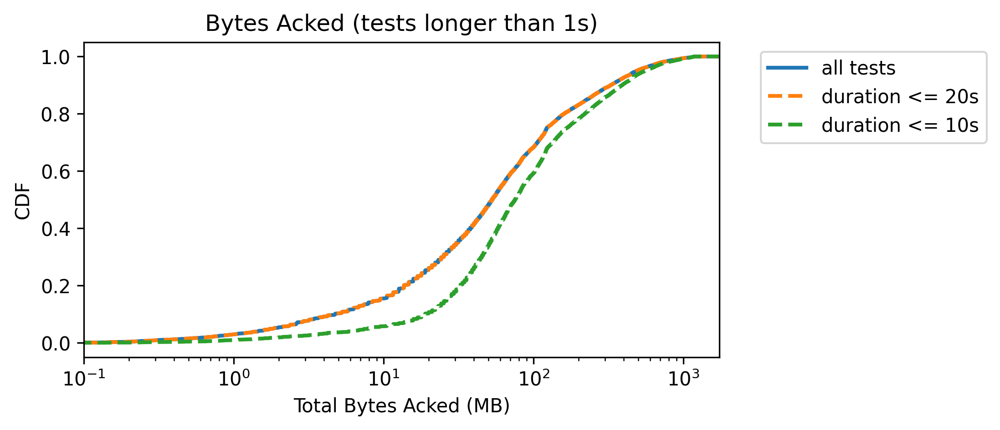

In [9]:
data_dist = get_dists(df_v3, 'TotalBytesAcked')
data_dist_lt20s = get_dists(df_v3[df_v3.Duration_s <= 20], 'TotalBytesAcked')
data_dist_lt10s = get_dists(df_v3[df_v3.Duration_s <= 10], 'TotalBytesAcked')

fig, ax = plt.subplots(dpi=300, figsize=(6,3))
ax.plot(data_dist.TotalBytesAcked/1e6, data_dist.cdf, linewidth=2, label='all tests')
ax.plot(data_dist_lt20s.TotalBytesAcked/1e6, data_dist_lt20s.cdf, linewidth=2, linestyle='--', label='duration <= 20s')
ax.plot(data_dist_lt10s.TotalBytesAcked/1e6, data_dist_lt10s.cdf, linewidth=2, linestyle='--', label='duration <= 10s')

ax.set_xscale('log')
ax.set_xlim(0.1, max(df_v3.TotalBytesAcked)/1e6)
ax.set_xlabel('Total Bytes Acked (MB)')
ax.set_ylabel("CDF")
ax.set_title(f"Bytes Acked (tests longer than {min_duration}s)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

print()

In [10]:
print(f"Most bytes transferred {max(df_v3.TotalBytesAcked)/1e6}MB")

Most bytes transferred 1740.977003MB


## Time series of a single test

In [11]:
print(df_v3.keys())
dp = df_v3
print("dp.TotalBytesAcked", dp.TotalBytesAcked[0])
print("dp.Duration_s", dp.Snapshots[0][-1]["ElapsedTime_us"], dp.Snapshots[1][-1]["ElapsedTime_us"])
print("# of snapshots", len(dp.Snapshots[0]), len(dp.Snapshots[1]))
print("avg throughput:", dp.TotalBytesAcked[0] * 8 / dp.Duration_s[0] / 1e6)
print("returned mean throughput:", dp.ReturnedThroughputMbps[0])
dp["Snapshots"][8]
#dp["Snapshots"][1][:10]

# Observations
# 1. Delta between timestamps are not uniform and not predictable.
# 2. Total test time is not constant.
# 3. Total number of snapshots is not constant.
# 4. "ReturnedThroughputMbps" does NOT match a naive (Bytes/ElapsedTime) computation.
#   4a. Question: is ReturnedThroughputMbps the ground truth?

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')
dp.TotalBytesAcked 61973178
dp.Duration_s 14760021 14369841
# of snapshots 12 142
avg throughput: 49.578542399999996
returned mean throughput: 47.128693814135104


array([{'row_num': 1, 'ElapsedTime_us': 0, 'BytesAcked': 0, 'DeltaTime_us': 0, 'DeltaBytes': 0, 'CurrAvgMbps': 0.0, 'CumAvgMbps': 0.0},
       {'row_num': 2, 'ElapsedTime_us': 170027, 'BytesAcked': 4182849, 'DeltaTime_us': 170027, 'DeltaBytes': 4182849, 'CurrAvgMbps': 196.80869508960342, 'CumAvgMbps': 196.80869508960342},
       {'row_num': 3, 'ElapsedTime_us': 340037, 'BytesAcked': 20707381, 'DeltaTime_us': 170010, 'DeltaBytes': 16524532, 'CurrAvgMbps': 777.5792953355685, 'CumAvgMbps': 487.1794775274456},
       {'row_num': 4, 'ElapsedTime_us': 460056, 'BytesAcked': 42110665, 'DeltaTime_us': 120019, 'DeltaBytes': 21403284, 'CurrAvgMbps': 1426.659712212233, 'CumAvgMbps': 732.2702453614341},
       {'row_num': 5, 'ElapsedTime_us': 1269975, 'BytesAcked': 51409943, 'DeltaTime_us': 809919, 'DeltaBytes': 9299278, 'CurrAvgMbps': 91.85390637829215, 'CumAvgMbps': 323.84853560109445},
       {'row_num': 6, 'ElapsedTime_us': 3089957, 'BytesAcked': 58441367, 'DeltaTime_us': 1819982, 'DeltaBytes':

### Plots of Multiple tests

In [12]:
def plot_snapshots(snapshots, returnedthroughputs, rows, cols, truncate=0, predictedthroughputs=[]):
  plotX = rows
  plotY = cols

  figure(figsize=(plotY * 2, plotX * 2))

  for i in range(plotX):
    for j in range(plotY):
      index = i * plotY + j
      data = snapshots[index]
      series = []
      timestamps = []
      for k, snapshot in enumerate(data):
        if truncate > 0 and k == truncate:
          break
        timestamps.append(snapshot["ElapsedTime_us"] / 1e6)
        series.append(snapshot["CurrAvgMbps"])

      plt.subplot(plotX, plotY, index+1)
      plt.plot(timestamps, series)
      plt.axhline(returnedthroughputs[index], color='r')
      if len(predictedthroughputs) > 0:
        plt.axhline(predictedthroughputs[index], color='g')

Index(['UUID', 'ClientIP', 'Site', 'TestTime', 'TotalBytesAcked', 'Duration_s',
       'ReturnedThroughputMbps', 'Snapshots', 'Cum_Estimate_full'],
      dtype='object')


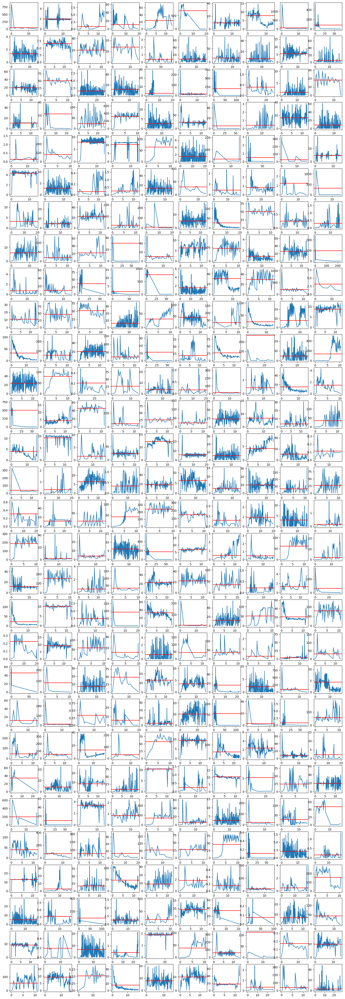

In [13]:
print(df_v3.keys())
plot_snapshots(df_v3.Snapshots, df_v3.ReturnedThroughputMbps, 30, 10)

# First model -- baseline

The first model will be just use the first INPUT_TRUNCATE_SNAPSHOTS datapoints. If there are less than MINIMUM_SNAPSHOTS datapoints in total then the test will not be used.

## Imports/Utilities for Tensorflow

In [14]:
import h5py
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.python.framework.ops import EagerTensor
from tensorflow.python.ops.resource_variable_ops import ResourceVariable
import time

tf.__version__

2023-06-05 03:26:51.648854: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-05 03:26:53.837131: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


'2.12.0'

## Utilities for Creating training/dev/test

### Visualizing how many snaphots each test has

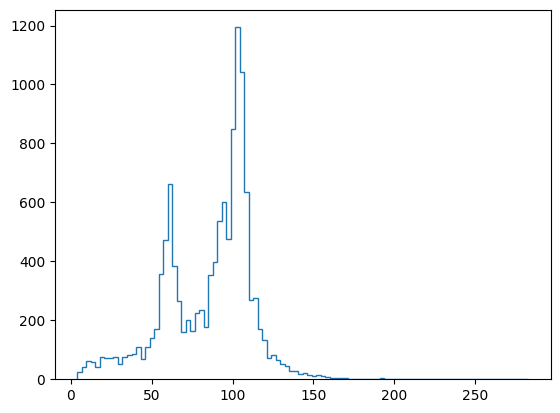

In [15]:
frequencies = []
for snapshots in df_v3.Snapshots:
  frequencies.append(len(snapshots))

counts, bins = np.histogram(frequencies, bins=100)
plt.stairs(counts, bins)

#### get_valid_serieses

In [16]:
# INPUT_TRUNCATE_SNAPSHOTS is the number of snapshots with which we will predict
# the final bandwidth.
#########INPUT_TRUNCATE_SNAPSHOTS = 80
# MINIMUM_SNAPSHOTS is an important number: it filters the dataset such that
# only the tests with at least this many number of datapoints is given a
# prediction.
#
# We can tweak this number such that only, say, tests with 50, or 70 datapoints
# are retained as "good tests". In order to do that though we would need a good
# rationale.
#########MINIMUM_SNAPSHOTS = 80

truncateNs = list(range(30, 51, 10))

# get_valid_serieses returns all tests that contains the minimum number of snapshots
def get_valid_serieses(minSnapshotsN):
  valid_serieses = []
  valid_returnedthroughputs = []
  for i in range(len(df_v3.Snapshots)):
    if len(df_v3.Snapshots[i]) >= minSnapshotsN:
      valid_serieses.append(df_v3.Snapshots[i])
      valid_returnedthroughputs.append(df_v3.ReturnedThroughputMbps[i])
  return valid_serieses, valid_returnedthroughputs

### Visualizing tests with `MINIMUM_SNAPSHOTS`



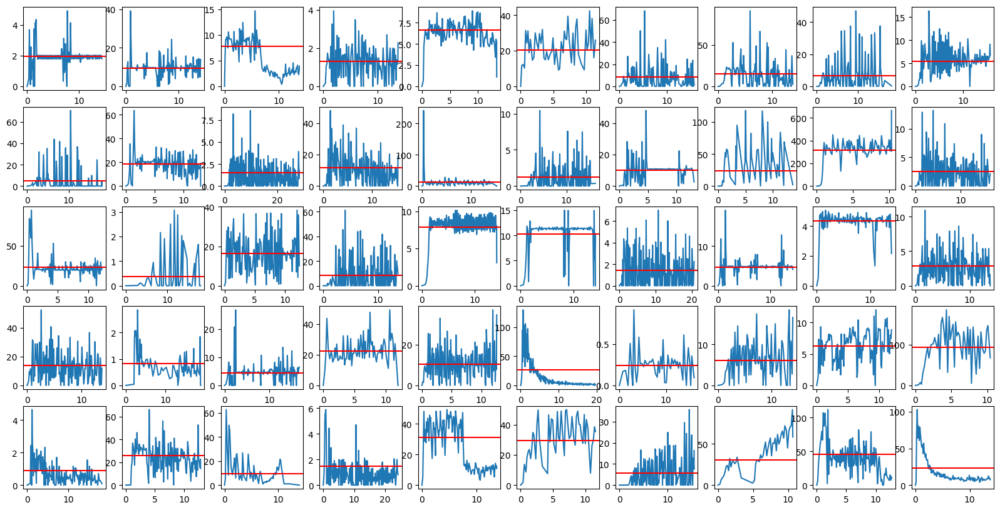

In [17]:
# Whether to enable printing the visualizations
# NOTE: There is a separate flag for the later result visualizations for convenience.
plot_visualization = True

if plot_visualization:
  SNAPSHOT_TRUNC_FOR_VISUALIZATION = truncateNs[-1]
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(SNAPSHOT_TRUNC_FOR_VISUALIZATION)
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10)

### Visualizing tests with `MINIMUM_SNAPSHOTS` and truncated with `INPUT_TRUNCATE_SNAPSHOTS`


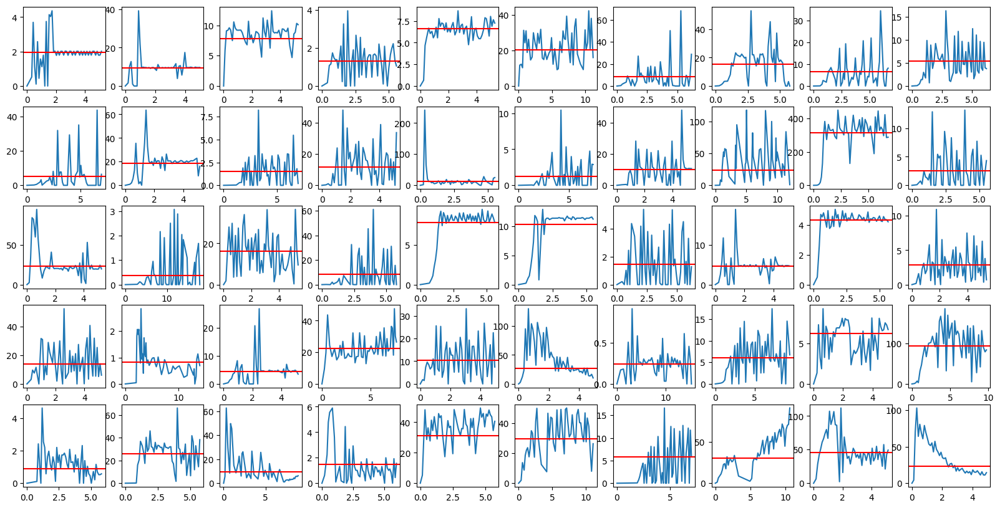

In [18]:
if plot_visualization:
  plot_snapshots(valid_serieses, valid_returnedthroughputs, 5, 10, truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION)

### Truncate and Create training/dev/test 

In [19]:
### Normalization idea: normalize everything to have the same range, but don't
### touch standard deviation or the mean (other than the range lower the mean
### proportionally).
def normalize(x, y):
  maxes = x.max(axis=1, keepdims=True)
  x /= maxes
  maxes = maxes.squeeze()
  y /= maxes

  def denormalize(y_norm):
    return y_norm * maxes
  return x, y, denormalize

def split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=False):
  onedim_valid_serieses = []
  labels = valid_returnedthroughputs
  for series in valid_serieses:
    onedim_series = []
    for snapshot in series[:truncateN]:
      onedim_series.append(snapshot["CurrAvgMbps"])
    onedim_valid_serieses.append(onedim_series)

  onedim_valid_serieses = np.asarray(onedim_valid_serieses)
  labels = np.asarray(labels).T

  TrainingSetEndIndex = round(len(onedim_valid_serieses) * 0.8)
  DevSetEndIndex = round(TrainingSetEndIndex + len(onedim_valid_serieses) * 0.1)
  TestSetEndIndex = len(onedim_valid_serieses)

  training_set = onedim_valid_serieses[:TrainingSetEndIndex]
  training_set_labels = labels[:TrainingSetEndIndex]
  dev_set = onedim_valid_serieses[TrainingSetEndIndex:DevSetEndIndex]
  dev_set_labels = labels[TrainingSetEndIndex:DevSetEndIndex]
  test_set = onedim_valid_serieses[DevSetEndIndex:]
  test_set_labels = labels[DevSetEndIndex:]

  training_set_unnorm, training_set_labels_unnorm = training_set.copy(), training_set_labels.copy()
  dev_set_unnorm, dev_set_labels_unnorm = dev_set.copy(), dev_set_labels.copy()
  test_set_unnorm, test_set_labels_unnorm = test_set.copy(), test_set_labels.copy()

  training_set, training_set_labels, denormalize_training = normalize(training_set, training_set_labels)
  dev_set, dev_set_labels, denormalize_dev = normalize(dev_set, dev_set_labels)
  test_set, test_set_labels, denormalize_test = normalize(test_set, test_set_labels)

  return training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm

## Multi-level Perceptron Model (initial model)

#### Get Data Function

In [20]:
# These maps are for visualization
valid_serieses_map, valid_returnedthroughputs_map = {}, {}

def get_input(minSnapshotN, truncateN, debug=False):
  valid_serieses, valid_returnedthroughputs = get_valid_serieses(minSnapshotN)
  valid_serieses_map[minSnapshotN], valid_returnedthroughputs_map[minSnapshotN] = valid_serieses, valid_returnedthroughputs
  training_set, training_set_labels, denormalize_training, training_set_labels_unnorm, dev_set, dev_set_labels, denormalize_dev, dev_set_labels_unnorm, test_set, test_set_labels, denormalize_test, test_set_labels_unnorm = split_datasets(valid_serieses, valid_returnedthroughputs, truncateN, debug=debug)
  x_train, y_train, x_dev, y_dev, x_test, y_test = training_set, training_set_labels, dev_set, dev_set_labels, test_set, test_set_labels
  return (
      [x_train, y_train, x_dev, y_dev, x_test, y_test],
      [denormalize_training, denormalize_dev, denormalize_test],
      [training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm]
  )


#### Model

In [21]:
learning_rate = 1e-3
num_epochs = 100
minibatch_size = 1000
enable_JTT = False
JTT_upsample = 10
JTT_cutoff_diff = 0.20
# Note: this is not a hyperparameter, this is the plotting density. The lower
# the number the more computation it has to run and hence the slower the training.
epoch_spacing = 20

def custom_loss(y_true, y_pred):
  loss = tf.reduce_mean(tf.pow(tf.abs(y_true - y_pred), 1.5))
  return loss

loss = tf.keras.losses.MeanSquaredError()
#loss = tf.keras.losses.MeanAbsoluteError()
metrics = [tf.keras.losses.MeanSquaredError()]
#loss = custom_loss

W, b, costs, train_acc, test_acc, train_preds, test_preds, training_set_labels_unnorm, dev_set_labels_unnorm, test_set_labels_unnorm = {}, {}, {}, {}, {}, {}, {}, {}, {}, {}

history = {}

denormalize_training, denormalize_dev, denormalize_test = {}, {}, {}

for truncateN in truncateNs:
  sample_weights = None
  for trainCount in range(1, 3): # Just train twice!
    if not enable_JTT and trainCount == 2:
      continue
    print(f"truncateN: {truncateN}")
    data_np, denorm_funcs, unnorm_labels = get_input(truncateN, truncateN, debug=False)

    x_train_np, y_train_np, x_dev_np, y_dev_np, x_test_np, y_test_np = data_np
    denormalize_training[truncateN], denormalize_dev[truncateN], denormalize_test[truncateN] = denorm_funcs
    training_set_labels_unnorm[truncateN], dev_set_labels_unnorm[truncateN], test_set_labels_unnorm[truncateN] = unnorm_labels

    model = tf.keras.models.Sequential(
        [tf.keras.layers.Input(shape=(truncateN,))]
        + [ tf.keras.layers.Dense(dim, activation=tf.nn.leaky_relu) for dim in [64, 16, 1] ]
    )

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss=loss,
                  metrics=metrics)
    
    print(f"{x_train_np.shape}, {y_train_np.shape}")
    history[truncateN] = model.fit(
        x_train_np,
        y_train_np,
        validation_data=(x_test_np, y_test_np),
        sample_weight=sample_weights,
        epochs=num_epochs,
        verbose=1,
    )
    train_preds[truncateN] = model.predict(x_train_np).squeeze()
    test_preds[truncateN] = model.predict(x_test_np).squeeze()

    if enable_JTT and trainCount == 1: # Reallocate weights
      diffs = np.abs(train_preds[truncateN] - y_train_np) / y_train_np
      new_weights = np.floor(diffs + 1 - JTT_cutoff_diff) * JTT_upsample
      new_weights += 1
      sample_weights = new_weights

      

truncateN: 30


2023-06-05 03:27:23.597807: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


(9294, 30), (9294,)
Epoch 1/100
291/291 [==============================] - 3s 5ms/step - loss: 0.1596 - mean_squared_error: 0.1593 - val_loss: 0.0119 - val_mean_squared_error: 0.0118
Epoch 2/100
291/291 [==============================] - 1s 3ms/step - loss: 0.1524 - mean_squared_error: 0.1522 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Epoch 3/100
291/291 [==============================] - 1s 3ms/step - loss: 0.1514 - mean_squared_error: 0.1512 - val_loss: 0.0111 - val_mean_squared_error: 0.0110
Epoch 4/100
291/291 [==============================] - 1s 3ms/step - loss: 0.1513 - mean_squared_error: 0.1510 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 5/100
291/291 [==============================] - 1s 2ms/step - loss: 0.1502 - mean_squared_error: 0.1499 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 6/100
291/291 [==============================] - 1s 3ms/step - loss: 0.1500 - mean_squared_error: 0.1497 - val_loss: 0.0107 - val_mean_squared_error: 0.0107
Ep

Epoch 51/100
291/291 [==============================] - 1s 2ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0123 - val_mean_squared_error: 0.0122
Epoch 52/100
291/291 [==============================] - 1s 2ms/step - loss: 0.0397 - mean_squared_error: 0.0396 - val_loss: 0.0184 - val_mean_squared_error: 0.0183
Epoch 53/100
291/291 [==============================] - 1s 2ms/step - loss: 0.0413 - mean_squared_error: 0.0415 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 54/100
291/291 [==============================] - 1s 2ms/step - loss: 0.0396 - mean_squared_error: 0.0396 - val_loss: 0.0134 - val_mean_squared_error: 0.0134
Epoch 55/100
291/291 [==============================] - 1s 3ms/step - loss: 0.0400 - mean_squared_error: 0.0400 - val_loss: 0.0130 - val_mean_squared_error: 0.0130
Epoch 56/100
291/291 [==============================] - 1s 3ms/step - loss: 0.0382 - mean_squared_error: 0.0381 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 57/100
291

37/37 [==============================] - 0s 1ms/step
truncateN: 40
(9084, 40), (9084,)
Epoch 1/100
284/284 [==============================] - 2s 3ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0059 - val_mean_squared_error: 0.0060
Epoch 2/100
284/284 [==============================] - 1s 2ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0058 - val_mean_squared_error: 0.0059
Epoch 3/100
284/284 [==============================] - 1s 2ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0060 - val_mean_squared_error: 0.0061
Epoch 4/100
284/284 [==============================] - 1s 3ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0055 - val_mean_squared_error: 0.0056
Epoch 5/100
284/284 [==============================] - 1s 3ms/step - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0057 - val_mean_squared_error: 0.0058
Epoch 6/100
284/284 [==============================] - 1s 3ms/step - loss: 0.0173 - mean_squared_e

36/36 [==============================] - 0s 2ms/step
truncateN: 50
(8797, 50), (8797,)
Epoch 1/100
275/275 [==============================] - 2s 4ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 2/100
275/275 [==============================] - 1s 3ms/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 3/100
275/275 [==============================] - 1s 3ms/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 4/100
275/275 [==============================] - 1s 3ms/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 5/100
275/275 [==============================] - 1s 3ms/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 6/100
275/275 [==============================] - 1s 2ms/step - loss: 0.0079 - mean_squared_e

275/275 [==============================] - 1s 3ms/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 100/100
35/35 [==============================] - 0s 2ms/step


In [22]:
model.evaluate(x_test_np, y_test_np, return_dict=True)["loss"]
model.metrics_names

35/35 [==============================] - 0s 2ms/step - loss: 0.0037 - mean_squared_error: 0.0037


['loss', 'mean_squared_error']

### Loss Plot per iteration

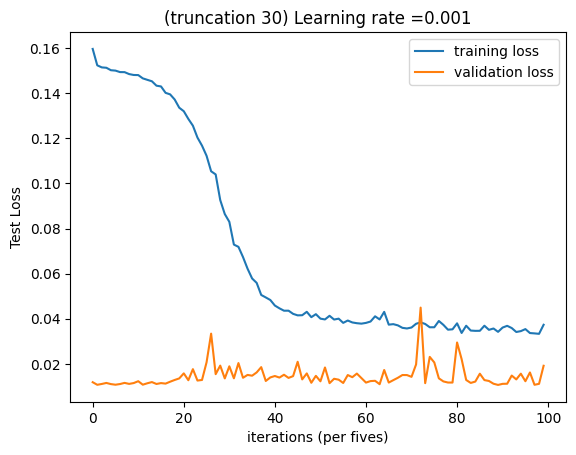

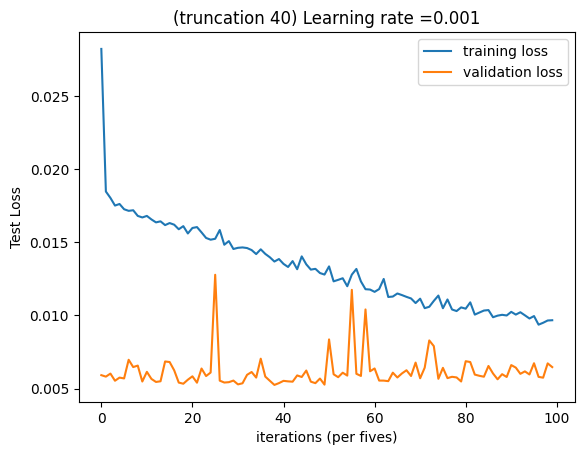

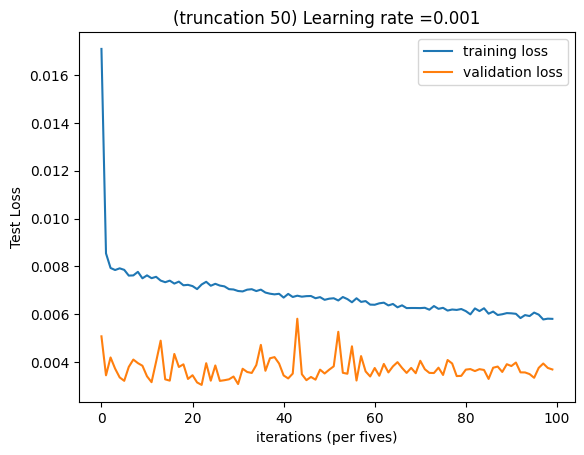

In [23]:
# Plot the train loss
for truncateN in truncateNs:
  plt.plot(np.squeeze(history[truncateN].history["loss"]), label="training loss")
  plt.ylabel('Train Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  # Plot the test loss
  plt.plot(np.squeeze(history[truncateN].history["val_loss"]), label="validation loss")
  plt.ylabel('Test Loss')
  plt.xlabel('iterations (per fives)')
  plt.title(f"(truncation {truncateN}) Learning rate =" + str(learning_rate))
  plt.legend()
  plt.show()


### Debugging

In [24]:
print(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION].shape)

# DEBUG: This is to check that these two tensors are indeed the same.
#yl = list(y_train.as_numpy_iterator())
#print(yl == training_set_labels)

#print(yl == training_set_labels)

"""

print(training_set_labels_unnorm.shape, train_preds.shape)

def print_samples(n):
  for i in range(n):
    print(training_set_labels_unnorm[i])
    print(train_preds[i])
print("Training set samples")
print_samples(20)

"""

#print(test_set_labels_unnorm[0])
#print(test_preds[0])

(1099,)


'\n\nprint(training_set_labels_unnorm.shape, train_preds.shape)\n\ndef print_samples(n):\n  for i in range(n):\n    print(training_set_labels_unnorm[i])\n    print(train_preds[i])\nprint("Training set samples")\nprint_samples(20)\n\n'

### Unnormalize predictions

In [25]:
for truncateN in truncateNs:
  train_preds[truncateN] = denormalize_training[truncateN](train_preds[truncateN])
  test_preds[truncateN] = denormalize_test[truncateN](test_preds[truncateN])

  # Shape check
  print(train_preds[truncateN].shape)
  print(test_preds[truncateN].shape)

(9294,)
(1162,)
(9084,)
(1135,)
(8797,)
(1099,)


## Result Visualization

### CDF of Accuracy

[ 20.94604529  52.89750161  93.70184338 ...  10.40433048  49.36506967
 194.09776188]
[ 29.4421463   52.25804368  92.32100093 ...  10.40340712  36.77913751
 202.71497396]
(1162,)
(1162,)
[ 30.00383277  87.89102876  13.58765024 ...  10.11832714  43.40853358
 191.65972669]
[ 25.53472223  90.35397919  16.09811738 ...  10.40340712  36.77913751
 202.71497396]
(1135,)
(1135,)
[ 47.49918831  30.50849395  80.44276625 ...  10.42203086  36.4814803
 200.71879546]
[ 48.23474697  27.80607879  73.52903593 ...  10.40340712  36.77913751
 202.71497396]
(1099,)
(1099,)


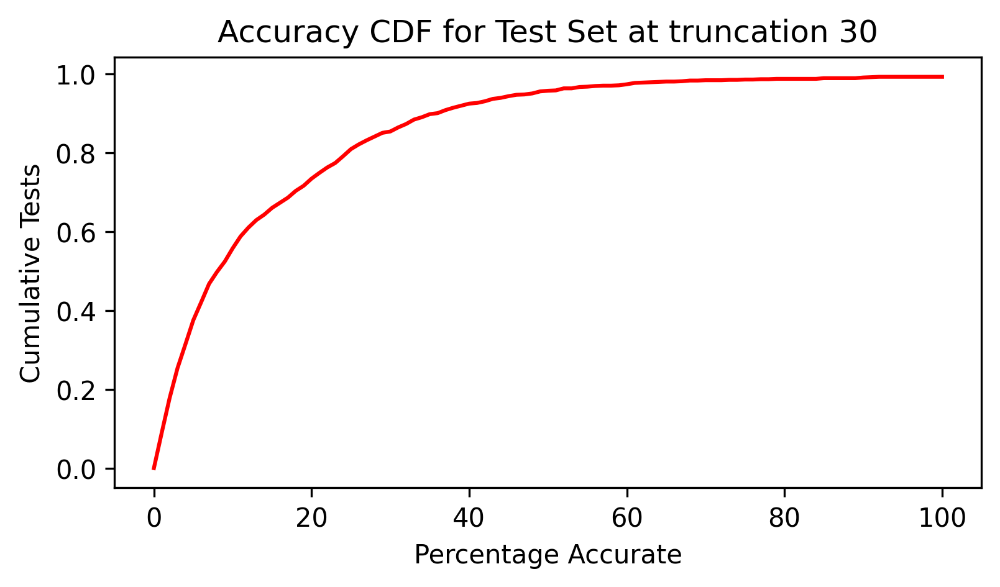

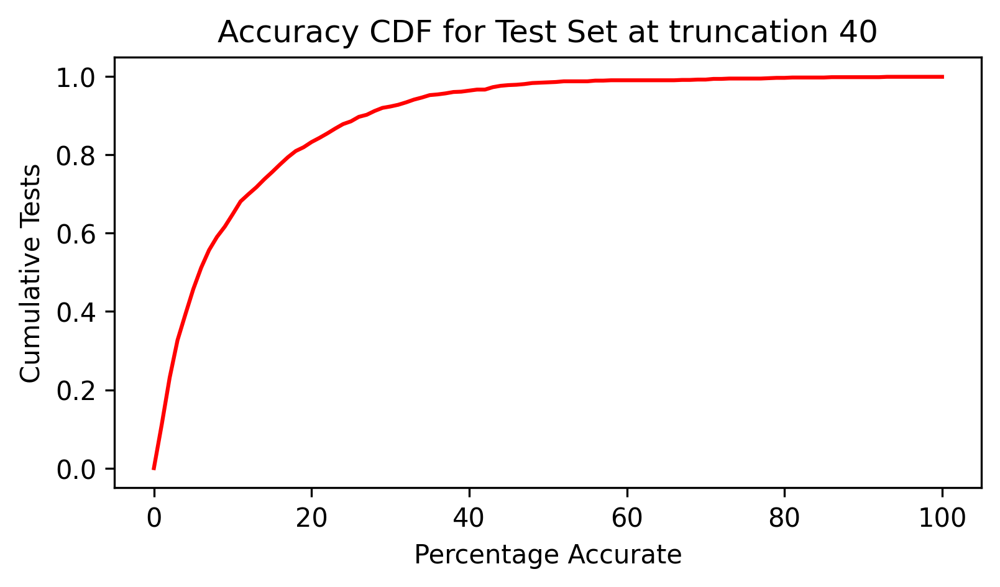

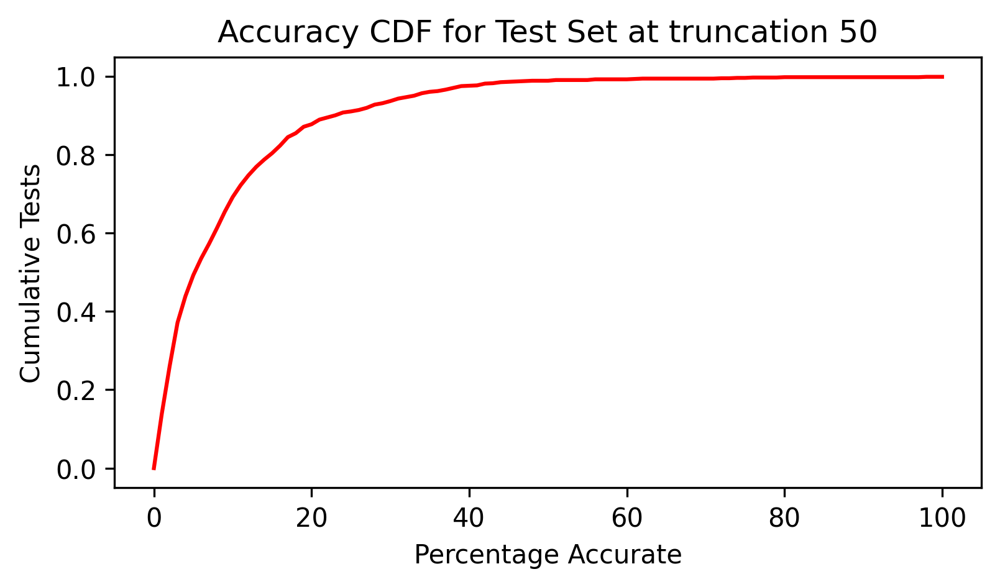

In [26]:
for truncateN in truncateNs:
  print(test_preds[truncateN])
  print(test_set_labels_unnorm[truncateN])
  print(test_preds[truncateN].shape)
  print(test_set_labels_unnorm[truncateN].shape)
  differences = np.abs(test_set_labels_unnorm[truncateN] - test_preds[truncateN]) / test_set_labels_unnorm[truncateN]

  freq = []
  for p in range(101):
    freq.append((differences < 0.01 * p).sum() / len(differences))

  fig, ax = plt.subplots(dpi=300, figsize=(6, 3))

  ax.set_title(f"Accuracy CDF for Test Set at truncation {truncateN}")
  ax.set_xlabel("Percentage Accurate")
  ax.set_ylabel("Cumulative Tests")
  ax.plot(list(range(101)), freq, color='r', label=f"All tests")

### Visualizations for a particular truncation

In [27]:
# Whether to enable printing the visualizations
plot_visualization = True
SNAPSHOT_TRUNC_FOR_VISUALIZATION = 50

#### Training Set

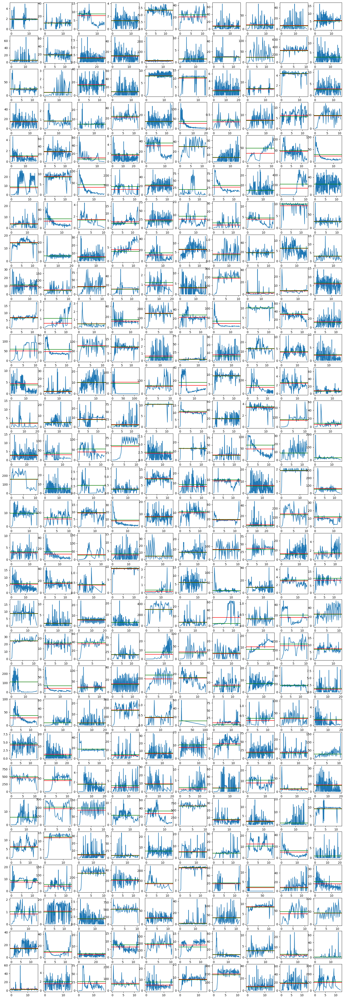

In [28]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      predictedthroughputs=train_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Training Set with truncation

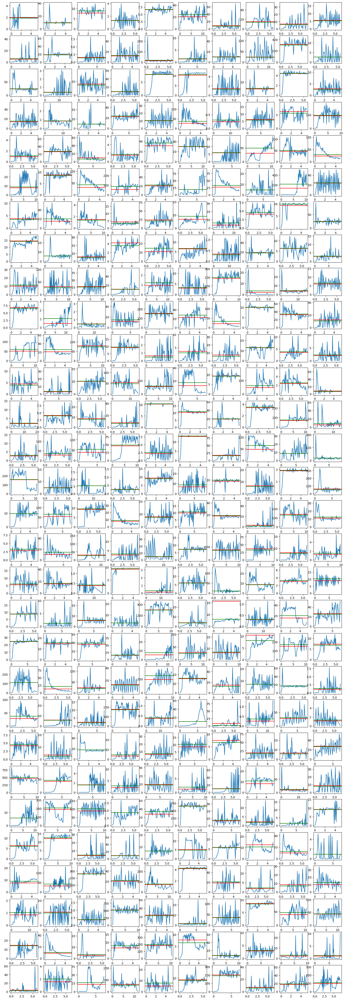

In [29]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=train_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set

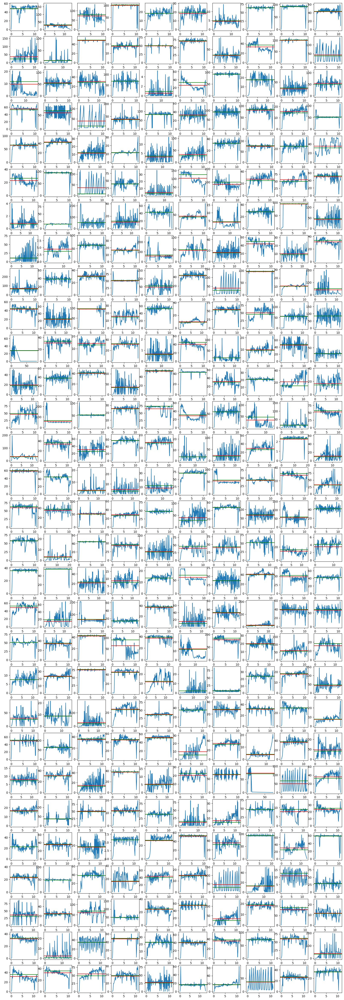

In [30]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      30, 10,
      predictedthroughputs=test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION])

#### Test set with truncation

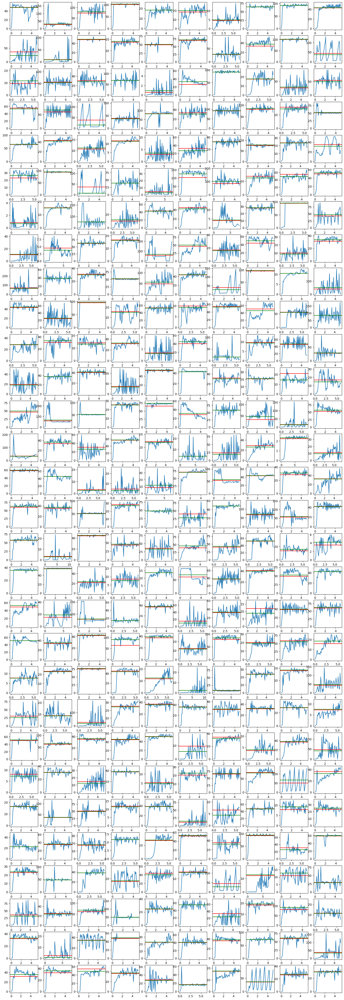

In [31]:
if plot_visualization:
  plot_snapshots(
      valid_serieses_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      valid_returnedthroughputs_map[SNAPSHOT_TRUNC_FOR_VISUALIZATION][-len(test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION]):],
      30, 10,
      truncate=SNAPSHOT_TRUNC_FOR_VISUALIZATION,
      predictedthroughputs=test_preds[SNAPSHOT_TRUNC_FOR_VISUALIZATION])